# **In the name of Allah**

**Deep learning final project**

**student** : Hadi Alizadeh
 
**Subject** : Replicating "The Cone of Silence: Speech Separation by Localization" with Google Colab: Training and Inference in the Cloud

In [ ]:
### Requirements
!pip install librosa
!pip install torch >= 1.3.0
!pip install soundfile
!pip install scipy
!pip install pyroomacoustics==0.3.1
!pip install matplotlib
!pip install mir_eval
!pip install tqdm
!pip install numpy
!pip install pysndfx
!apt -qq install -y sox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement 1.3.0 (from versions: none)
ERROR: No matching distribution found for 1.3.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 KB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyroomacoustics: filename=pyroomacoustics-0.3.1-cp38-cp38-linux_x86_64.whl size=632411 sha256=944a73268f5c8a859a1615423497b401c1dfbcdd5bd773723ef8f4a6d0beddf4
  Stored in directory: /root/.cache/pip/wheels/c0/0f/42/2ee3bf7b0e18b089dc546f5cd1bda398387922d5018c9b82ab
Successfully built pyroomacoustics
Looking in indexes: ht

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!cp -r "/content/drive/MyDrive/main.zip" "/content" # copy requirement files from g_drive
!unzip "main.zip"                                   # unzip files
!mv "/content/content/Cone-of-Silence" "/content"   # move the main file to best path
!rm -rf /content/main.zip                           # remove zip file (because of storage problem)

Archive:  main.zip
   creating: content/Cone-of-Silence/
   creating: content/Cone-of-Silence/checkpoints/
 extracting: content/Cone-of-Silence/checkpoints/info.txt  
  inflating: content/Cone-of-Silence/LICENSE  
   creating: content/Cone-of-Silence/.ipynb_checkpoints/
  inflating: content/Cone-of-Silence/.gitignore  
   creating: content/Cone-of-Silence/outputs/
 extracting: content/Cone-of-Silence/outputs/info.txt  
   creating: content/Cone-of-Silence/outputs/some_dirname/
   creating: content/Cone-of-Silence/outputs/some_dirname/008/
  inflating: content/Cone-of-Silence/outputs/some_dirname/008/output_angle137.81.wav  
  inflating: content/Cone-of-Silence/outputs/some_dirname/008/output_angle47.81.wav  
  inflating: content/Cone-of-Silence/outputs/some_dirname/008/positions.png  
  inflating: content/Cone-of-Silence/outputs/some_dirname/008/output_angle-59.06.wav  
   creating: content/Cone-of-Silence/outputs/some_dirname/003/
  inflating: content/Cone-of-Silence/outputs/some_dirn

In [ ]:
!cp -r "/content/drive/MyDrive/vctk-dataset" "/content/" # copy dataset files from g_drive
!unzip "/content/vctk-dataset"                           # unzip files
!rm -rf /content/vctk-dataset                            # remove zip file (because of storage problem)

Streaming output truncated to the last 5000 lines.
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_173.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_174.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_175.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_176.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_177.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_178.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_179.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_180.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_181.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_182.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_183.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_184.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_185.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_186.wav  
  inflating: VCTK-Corpus/VCTK-Corpus/wav48/p340/p340_187.wav  
  in

In [ ]:
# This is another way to download dataset

#!wget "https://datashare.ed.ac.uk/download/DS_10283_2651.zip" # if dataset file has problem you can run this block to download dataset.

--2023-03-02 21:42:41--  https://datashare.ed.ac.uk/download/DS_10283_2651.zip
Resolving datashare.ed.ac.uk (datashare.ed.ac.uk)... 192.41.117.26
Connecting to datashare.ed.ac.uk (datashare.ed.ac.uk)|192.41.117.26|:443... connected.
HTTP request sent, awaiting response... 200 200
Length: 11166618959 (10G) [application/zip]
Saving to: ‘DS_10283_2651.zip’

DS_10283_2651.zip    41%[=======>            ]   4.36G  1.17MB/s    eta 87m 30s^C


## Generate dataset
We need to extract data from the dataset to train and test the model.

In [ ]:
# at first we change directory of runing

%cd /content/Cone-of-Silence/

/content/Cone-of-Silence


### Generate training dataset

In [ ]:
!python cos/generate_dataset.py \
   /content/VCTK-Corpus/VCTK-Corpus/wav48 \
    ./outputs/content/train \
    --input_background_path /content/drive/MyDrive/Babble_noise.wav \
    --n_voices 2 \
    --n_outputs 500 \
    --mic_radius {0.0725} \
    --n_mics {6}

100% 500/500 [05:30<00:00,  1.51it/s]


### Generate test dataset

In [ ]:
!python cos/generate_dataset.py \
    /content/VCTK-Corpus/VCTK-Corpus/wav48 \
    ./outputs/content/test \
    --input_background_path /content/drive/MyDrive/Babble_noise.wav\
    --n_voices 2 \
    --n_outputs 100 \
    --mic_radius {0.0725} \
    --n_mics {6}

100% 100/100 [01:08<00:00,  1.47it/s]


### Loading and play generated data
please Pay attention to the selected sound track

In [ ]:
# play train dataset
from IPython.display import Audio
import librosa
y, sr = librosa.load(('/content/Cone-of-Silence/outputs/content/train/00000/mic00_mixed.wav'))
Audio(data=y, rate=sr)

In [ ]:
# play test dataset
y, sr = librosa.load(('/content/Cone-of-Silence/outputs/content/test/00000/mic00_mixed.wav'))
Audio(data=y, rate=sr)

## Training model

In [ ]:
!python cos/training/train.py \
   ./outputs/content/train \
   ./outputs/content/test \
   --name M6 \
   --checkpoints_dir ./checkpoints \
   --batch_size 8 \
   --mic_radius {0.0725} \
   --n_mics {6} \
   --epochs {7} \
   --use_cuda

2023-03-05 06:44:55.046456: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-05 06:44:58.496973: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-05 06:44:58.497590: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-05 06:44:58.497628: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF

## Train by Initializing with a pre-trained model

In [ ]:
!python cos/training/train.py \
   ./outputs/content/train \
   ./outputs/content/test \
   --name M6_v1 \
   --checkpoints_dir ./checkpoints \
   --pretrain_path /content/drive/MyDrive/synthetic_6mics_.0725m_44100kHz.pt\
   --batch_size 8 \
   --mic_radius {0.0725} \
   --n_mics {6} \
   --epochs {1} \
   --use_cuda

2023-03-06 04:30:14.149948: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-06 04:30:16.756228: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-06 04:30:16.756455: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-06 04:30:16.756476: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT War

## Loading TensorBoard
We use tensorboard to show Network graph and training loss

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/Cone-of-Silence/runs 

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

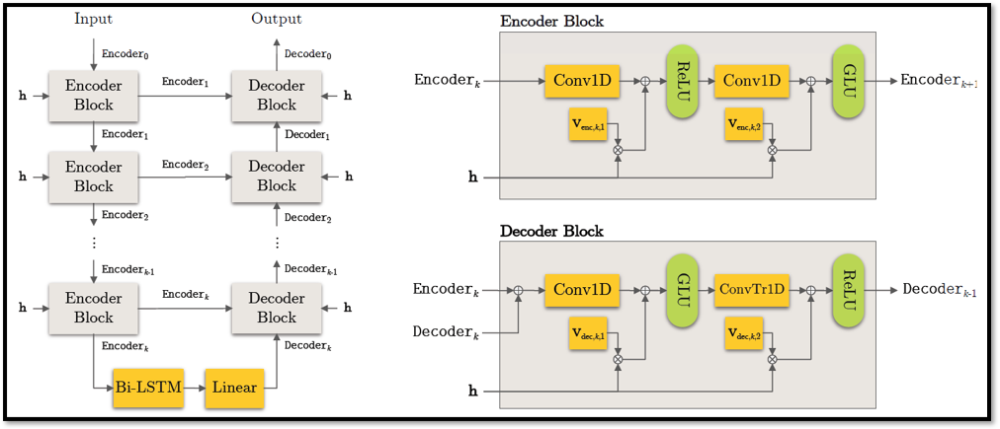

In [4]:
from IPython.display import display, Image
display(Image(filename='/content/model_p.png'))

## Evaluation

In [ ]:
#generate dataset without background noise
!python cos/generate_dataset.py \
   /content/VCTK-Corpus/VCTK-Corpus/wav48 \
    ./outputs/eval \
    --n_voices 2 \
    --n_outputs 100 \
    --mic_radius {0.0725 } \
    --n_mics {6}

100% 100/100 [01:17<00:00,  1.28it/s]


In [ ]:
!python cos/inference/evaluate_synthetic.py \
    /content/Cone-of-Silence/outputs/eval \
    /content/Cone-of-Silence/checkpoints/M6_v1/1.pt \
    --n_channels 6 \
    --mic_radius .0725 \
    --sr 44100 \
    --use_cuda \
    --n_workers 1 \
    --n_voices {2}\

Namespace(debug=False, mic_radius=0.0725, model_checkpoint='/content/Cone-of-Silence/checkpoints/M6_v1/1.pt', n_channels=6, n_voices=2, n_workers=1, oracle_position=False, prec_recall=False, sr=44100, test_dir='/content/Cone-of-Silence/outputs/eval', use_cuda=True)
 18% 18/100 [00:34<02:38,  1.93s/it]Had to go again

 55% 55/100 [01:58<01:20,  1.79s/it]Had to go again

 70% 70/100 [02:34<00:57,  1.93s/it]Had to go again

 77% 77/100 [02:57<00:52,  2.26s/it]Had to go again

 80% 80/100 [03:11<01:04,  3.22s/it]Had to go again

 98% 98/100 [04:01<00:05,  2.96s/it]Had to go again

100% 100/100 [04:14<00:00,  2.55s/it]
Median Angular Error:  1.5709983848244644
Median SI-SDRi:  14.187845879262815


In [ ]:
!python cos/inference/evaluate_synthetic.py \
    /content/Cone-of-Silence/outputs/eval \
    /content/Cone-of-Silence/checkpoints/M6_v1/1.pt \
    --n_channels 6 \
    --mic_radius .0725 \
    --sr 44100 \
    --use_cuda \
    --n_workers 1 \
    --n_voices {2}\
    --prec_recall

Namespace(debug=False, mic_radius=0.0725, model_checkpoint='/content/Cone-of-Silence/checkpoints/M6_v1/1.pt', n_channels=6, n_voices=2, n_workers=1, oracle_position=False, prec_recall=True, sr=44100, test_dir='/content/Cone-of-Silence/outputs/eval', use_cuda=True)
100% 100/100 [03:43<00:00,  2.23s/it]
Overall Precision: 0.8868778280542986 Recall: 0.98


## **Test model on real dataset**

In [ ]:
!python cos/inference/separation_by_localization.py \
    /content/drive/MyDrive/realdata_4mics_.03231m_44100kHz.pt \
    /content/drive/MyDrive/real_multiple_speakers_4mics.wav \
    outputs/some_dirname/ \
    --n_channels 4 \
    --sr 44100 \
    --mic_radius .03231 \
    --use_cuda

/content/Cone-of-Silence/cos/inference/cos/helpers/eval_utils.py:36: RuntimeWarning: divide by zero encountered in float_scalars
  SDR = 10 * math.log10(Sss/Snn)
/content/Cone-of-Silence/cos/inference/cos/helpers/eval_utils.py:36: RuntimeWarning: divide by zero encountered in float_scalars
  SDR = 10 * math.log10(Sss/Snn)
/content/Cone-of-Silence/cos/inference/cos/helpers/eval_utils.py:36: RuntimeWarning: divide by zero encountered in float_scalars
  SDR = 10 * math.log10(Sss/Snn)
/content/Cone-of-Silence/cos/inference/cos/helpers/eval_utils.py:36: RuntimeWarning: divide by zero encountered in float_scalars
  SDR = 10 * math.log10(Sss/Snn)
/content/Cone-of-Silence/cos/inference/cos/helpers/eval_utils.py:36: RuntimeWarning: divide by zero encountered in float_scalars
  SDR = 10 * math.log10(Sss/Snn)
/content/Cone-of-Silence/cos/inference/cos/helpers/eval_utils.py:36: RuntimeWarning: divide by zero encountered in float_scalars
  SDR = 10 * math.log10(Sss/Snn)
/content/Cone-of-Silence/cos

In [ ]:
import librosa
from IPython.display import Audio
y, sr = librosa.load(('/content/drive/MyDrive/real_multiple_speakers_4mics.wav'))
Audio(data=y, rate=sr)

## **The first part of the audio**

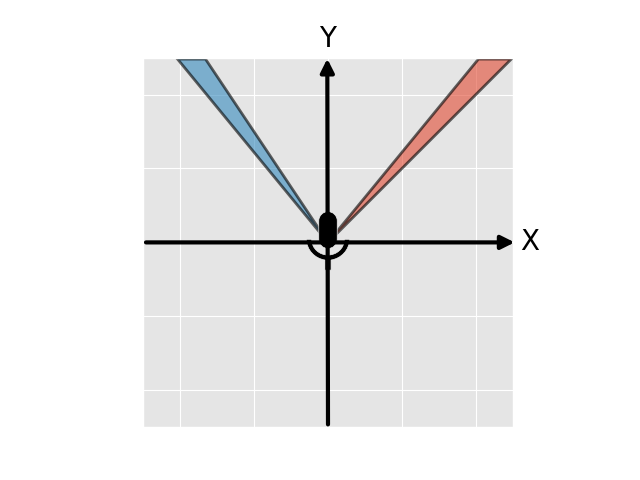

In [ ]:
from IPython.display import display, Image
display(Image(filename='/content/Cone-of-Silence/outputs/some_dirname/000/positions.png'))

In [ ]:
y, sr = librosa.load(('/content/Cone-of-Silence/outputs/some_dirname/000/output_angle126.56.wav'))
Audio(data=y, rate=sr)

In [ ]:
y, sr = librosa.load(('/content/Cone-of-Silence/outputs/some_dirname/000/output_angle47.81.wav'))
Audio(data=y, rate=sr)

## **The fourth part of the sound**

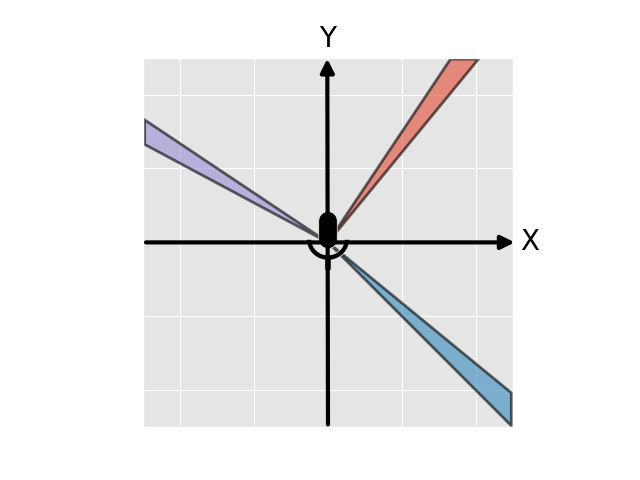

In [ ]:
from IPython.display import display, Image
display(Image(filename='/content/Cone-of-Silence/outputs/some_dirname/004/positions.png'))

In [ ]:
y, sr = librosa.load(('/content/Cone-of-Silence/outputs/some_dirname/004/output_angle-42.19.wav'))
Audio(data=y, rate=sr)

In [ ]:
y, sr = librosa.load(('/content/Cone-of-Silence/outputs/some_dirname/004/output_angle149.06.wav'))
Audio(data=y, rate=sr)

In [ ]:
y, sr = librosa.load(('/content/Cone-of-Silence/outputs/some_dirname/004/output_angle53.44.wav'))
Audio(data=y, rate=sr)